<a href="https://colab.research.google.com/github/RhondaFischer/CTILGrowth/blob/main/DSbertopic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture
!pip install bertopic

In [2]:
#from sklearn.datasets import fetch_20newsgroups
#docs = fetch_20newsgroups(subset='all',  remove=('headers', 'footers', 'quotes'))['data']
#docs[0]

In [3]:
from bertopic import BERTopic

topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
#topics, probs = topic_model.fit_transform(docs)

In [5]:
#from bertopic import BERTopic
import pandas as pd
import numpy as np
import requests
import time
import pytz
import tweepy
from datetime import datetime, timedelta
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
import string

import re

from sklearn.decomposition import NMF, LatentDirichletAllocation

from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud, STOPWORDS 
from collections import Counter


import matplotlib.pyplot as plt
%matplotlib inline
string.punctuation

stopWords = set(stopwords.words('english'))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [6]:
month_dict = {'Jan':'1', 'Feb':'2', 'Mar':'3', 'Apr':'4', 'May':'5', 'Jun': '6', 
              'Jul': '7', 'Aug': '8', 'Sep': '9', 'Oct':'10', 'Nov':'11', 'Dec':'12' }
day_of_week = {'Sun':'1', 'Mon':'2', 'Tue':'3', 'Wed': '4', 'Thu': '5', 'Fri':'6', 'Sat':'7'}
def process_lumin_tweet(status,is_retweeted, counter = 0):
    counter +=1
    
    
    try:
        status = status._json
    except AttributeError as error:
        pass
    #tweet_data = {}
    tweet_data = pd.DataFrame(columns = [col_names])
    try:
        tweet_text = (status["extended_tweet"]["full_text"]).strip().replace('\n', ' ').replace('\r', '').replace(',', '').replace(u'’', u"'")
        is_extended=True
    except KeyError:
        tweet_text = (status["full_text"]).strip().replace('\n', ' ').replace('\r', '').replace(',', '').replace(u'’', u"'")
        is_extended=False
        
    tweet_id = str(status["id"])
    created_at = status["created_at"]
    tweet_yr = created_at[-4:-1]+created_at[-1]
    tweet_mo = created_at[4:7]
    tweet_mo_nbr = month_dict[tweet_mo]
    tweet_day = created_at[8:10]
    tweet_day_of_week = created_at[0:3]
    tweet_dow_nbr = day_of_week[tweet_day_of_week]
    tweet_hr = created_at[11:13]
    s = "-"
    seq = (tweet_yr, tweet_mo_nbr, tweet_day)
    tweet_date = s.join(seq)
    is_extended_tweet = is_extended
    is_retweet = is_retweeted
    is_quote_tweet = hasattr(status, "quoted_status")
    lang = status["lang"]
    
    if is_extended:
        url_count = len(status["extended_tweet"]["entities"]["urls"])
        hashtag_count = len(status["extended_tweet"]["entities"]["hashtags"])
    else:
        url_count = len(status["entities"]["urls"])
        hashtag_count = len(status["entities"]["hashtags"])
    
    user_json = status["user"]
    
    user_id = str(user_json["id"])
    screen_name = user_json["screen_name"]
    link_to_tweet = "https://twitter.com/{}/status/{}".format(tweet_data["screen_name"], status["id"])
    followers_count = user_json["followers_count"]
    friends_count = user_json["friends_count"]
    user_created_at = user_json["created_at"]
    user_statuses_count = user_json["statuses_count"]
    user_age_days = ((datetime.utcnow().replace(tzinfo=pytz.utc) - datetime.strptime(user_json['created_at'], "%a %b %d %H:%M:%S %z %Y")).days)
    try:
        tweets_per_day = user_json['statuses_count'] / user_age_days
    except ZeroDivisionError:
        tweets_per_day = 0
    user_tweets_per_day = tweets_per_day
    user_age_days = user_age_days
    
    retweet_count = status["retweet_count"]
    favorite_count = status["favorite_count"]
    rechecked_time = ((datetime.utcnow().replace(tzinfo=pytz.utc)))
    
    tweet_list = [tweet_text,
                  tweet_id,
                  created_at,
                  tweet_yr,
                  tweet_mo,
                  tweet_mo_nbr,
                  tweet_day,
                  tweet_hr,
                  tweet_day_of_week,
                  tweet_dow_nbr,
                  tweet_date,
                 is_extended_tweet,
                 is_retweet,
                 is_quote_tweet,
                 url_count,
                 hashtag_count,
                 lang,
                 user_id,
                 screen_name,
                 link_to_tweet,
                 followers_count,
                 friends_count,
                 user_created_at,
                 user_statuses_count,
                 user_tweets_per_day,
                 user_age_days,
                 retweet_count,
                 favorite_count,
                 rechecked_time]
    #print("tweet_list", tweet_list)

    return tweet_list


In [7]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [8]:
%cd /content/drive/MyDrive/TwitterLuminaries/

/content/drive/MyDrive/TwitterLuminaries


In [9]:
lumin=pd.read_csv("dsLuminaries.csv")
lumin.columns=['handle']

In [10]:
lumin_list=list(lumin['handle'])
tweet_results_df = {
    'tweet_text': [], 'tweet_id': [], 'created_at': [], 'tweet_yr': [], 'tweet_mo':[], 'tweet_mo_nbr':[],
    'tweet_day': [], 'tweet_hr': [],'tweet_day_of_week':[] ,'tweet_dow_nbr':[], 'tweet_date': [], 'is_extended_tweet': [],
    'is_retweet': [], 'is_quote_tweet': [], 'url_count': [], 'hashtag_count': [], 'lang': [],
    'user_id': [], 'screen_name': [], 'link_to_tweet': [], 'followers_count': [],
    'friends_count': [], 'user_created_at': [], 'user_statuses_count': [], 'user_tweets_per_day': [],
    'user_age_days': [], 'retweet_count': [], 'favorite_count': [], 'rechecked_time': []
}

col_names = list(tweet_results_df.keys())

In [11]:
tweet_result_df2 = pd.read_csv("full_ds_lumin_tweets_Nov5.csv")

In [12]:
X = tweet_result_df2.copy()

In [13]:
X.columns = X.columns.get_level_values(0)

In [14]:
# creating a function to encapsulate EDA/preprocessing
# Take a dataframe as input and return DF as output
# Add new numerical features to the dataframe (e.g., number of words in the string)
#
def textPreprocessing(df):
    #lowercase the text strings and remove punctuation
    # store in a new column
    df['processed'] = df['tweet_text'].apply(lambda x: re.sub(r'[^\w\s]',' ', x.lower()))  #\w [a-zA-Z0-9_] \s [ \t\n\r\f\v]
    
    # numerical feature engineering
    # total length of sentence
    df['length'] = df['processed'].apply(lambda x: len(x))
    # get number of words
    df['words'] = df['processed'].apply(lambda x: len(x.split(' ')))
    df['words_not_stopword'] = df['processed'].apply(lambda x: len([t for t in x.split(' ') if t not in stopWords]))
    # get the average word length
    df['avg_word_length'] = df['processed'].apply(lambda x: np.mean([len(t) for t in x.split(' ') if t not in stopWords]) if len([len(t) for t in x.split(' ') if t not in stopWords]) > 0 else 0)
    # get the sum(map(text.count, string.punctuation))/len(text)
    df['punctuationRatio'] = df['tweet_text'].apply(lambda x: sum(map(x.count, string.punctuation))/len(x))
    df['commas'] = df['tweet_text'].apply(lambda x: x.count(','))

    return(df)  # return a dataframe for now

#datasets["train"] = textPreprocessing(datasets["train"])
#datasets["train"].head()

In [15]:
tweetset = textPreprocessing(X)

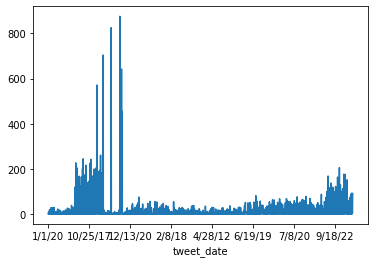

In [16]:
tweetset.groupby(by='tweet_date').size().plot()

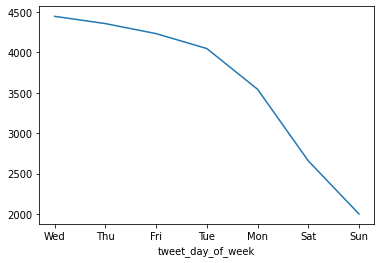

In [17]:
tweetset.groupby(by='tweet_day_of_week').size().sort_values(ascending = False).plot()

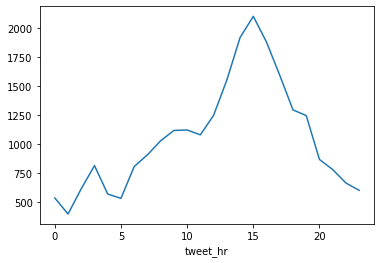

In [18]:
tweetset.groupby(by='tweet_hr').size().plot()

In [19]:
numeric_features = ['url_count', 'hashtag_count','followers_count', 'friends_count',
                    'user_tweets_per_day','user_age_days', 'retweet_count',
                    'favorite_count',
                    'length', 'words', 'words_not_stopword', 'avg_word_length', 
                    'punctuationRatio', 'commas']
text_features = ['processed']
categorical_features = ['is_retweet', 'tweet_day_of_week']

In [20]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.stem.porter import PorterStemmer
import re
from sklearn.compose import ColumnTransformer

In [21]:
from sklearn.base import BaseEstimator, TransformerMixin

class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values  #return a Numpy Array to observe the pipeline protocol

In [22]:
# We create the preprocessing pipelines for both numeric and categorical data.
max_words = 500

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('onehotencoder', OneHotEncoder(handle_unknown='ignore'))])

text_pipeline = Pipeline([
                ('selector', DataFrameSelector('processed')),
                #('tfidf', TfidfVectorizer( stop_words='english')),
                ('tfidf', TfidfVectorizer( norm=None, analyzer='word',
                           max_features=max_words,
                           ngram_range = (1,1),
                            stop_words='english',
                            #stop_words = my_stop_words,
                            #tokenizer=tokenize,
                            use_idf = True,
                           ))
                #('dense', sparse_to_dense())
            ])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),
        ('txt', text_pipeline, text_features)
    ], 
    remainder='drop',
    n_jobs=-1)


In [23]:
X_transformed_sparse = preprocessor.fit_transform(tweetset)
X_transformed_dense = X_transformed_sparse.toarray()

#print(preprocessor.transformers_[1][1])
#print(preprocessor.transformers_[2][1].named_steps["tfidf"].get_feature_names())

column_names1 = numeric_features  + list(preprocessor.transformers_[1][1].named_steps["onehotencoder"].get_feature_names_out(categorical_features))
column_names2 = list(preprocessor.transformers_[2][1].named_steps["tfidf"].get_feature_names_out())
column_names = column_names1+column_names2
print("number of columns:", len(column_names))
display(pd.DataFrame(X_transformed_dense,  columns=column_names).head())
number_of_inputs = X_transformed_dense.shape[1]
dense_df = pd.DataFrame(X_transformed_dense,  columns=column_names)
print("Total Rows:",len(dense_df), "Columns:", len(dense_df.columns))

number of columns: 522


,url_count,hashtag_count,followers_count,friends_count,user_tweets_per_day,user_age_days,retweet_count,favorite_count,length,words,...,womenintech,work,working,world,xbond49,year,years,yes,ym78200,yuhelenyu
0,0.506359,0.057489,1.03077,-0.327681,0.439265,-0.246244,-0.070019,-0.068068,1.221182,1.000222,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.506359,0.684261,1.03077,-0.327681,0.439265,-0.246244,-0.041091,-0.048898,0.082440,0.470565,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-1.288979,1.781111,1.03077,-0.327681,0.439265,-0.246244,-0.074151,-0.069077,1.397276,1.294476,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.506359,-0.569282,1.03077,-0.327681,0.439265,-0.246244,-0.057621,-0.058988,1.139005,1.117924,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-1.288979,-0.882668,1.03077,-0.327681,0.439265,-0.246244,-0.074151,-0.069077,-2.230262,-2.295425,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Total Rows: 25280 Columns: 522


In [24]:
dense_df['screen_name']=tweetset['screen_name'].copy()

In [25]:
dense_df['words_not_stopword'].mean()

-4.4971059225322796e-17

In [26]:
def create_nmf_df(number_of_topics, features_per_topic, fitted_corpus, source, word_list):

    #nmf = NMF(n_components=number_of_topics, solver="mu")
    #nmf = NMF(n_components=number_of_topics, random_state=1, alpha=.1, l1_ratio=.5)
    nmf = NMF(n_components=number_of_topics, random_state=1, beta_loss='kullback-leibler', solver='mu', max_iter=1000, alpha_W=.1,l1_ratio=.5)
    
    
    W = nmf.fit_transform(fitted_corpus)
    H = nmf.components_
    nmf_list = []

    for i, topic in enumerate(H):
        print("Topic {}: {}".format(i + 1, ", ".join([str(x) for x in word_list[topic.argsort()[-features_per_topic:]]])))
        #print(-number_of_topics)
        top_features_ind = topic.argsort()[:-number_of_topics - 1:-1]

In [27]:
def create_tf_df(max_words, tf_corpus, source):
    
    print("**** tf *******")

    tf_vect = CountVectorizer(max_df=0.95, min_df=2,
                                    analyzer='word',
                                    max_features=max_words,
                                    ngram_range = (1,1),
                                    tokenizer=tokenize
                                    )
    tf_fit_vec = tf_vect.fit(tf_corpus)
    tf = tf_fit_vec.transform(tf_corpus)

    # create an array of the names
    tf_words = np.array(tf_vect.get_feature_names_out())
    print("length of tf_words", len(tf_words))

    # sort the words by top frequency
    sum_tf = tf.sum(axis=0)
    words_tf = [(word, sum_tf[0, idx]) for word, idx in tf_fit_vec.vocabulary_.items()]
    words_tf =sorted(words_tf, key = lambda x: x[1], reverse=True)
    
    # create a data frame with graph headings and print the header 
    tf_df = pd.DataFrame(words_tf[0:50], columns = [["Token", "Count"]])
    tf_df = tf_df[['Token','Count']]
    print(tf_df.head(25), "\n")
    
    # create tf word cloud
    words = tf_df['Token'].to_numpy()
    words = list(words.T)
    listToStr = ' '.join([elem for elem in words[0]])
    wordcloud = WordCloud(width = 1000, height = 1000, 
                background_color ='white', 
                stopwords = my_stop_words, 
                min_font_size = 10).generate(listToStr) 
    
    # plot the WordCloud image                        
    plt.figure(figsize = (4, 6), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show()

    
    return tf_df, tf, tf_words

# tf_df, tf = create_tf_df(100000,all_corpus['IsraelNAS'])

In [28]:
# functions for tokenizing the tweets, removing stop words, including key words
# using reg expressions to remove website and hashtag strings (starting with http and #)
# only using text characters and character strings with lengths between 2 and 20 characters

my_stop_words = text.ENGLISH_STOP_WORDS.union(["https", "http", "amp", "like","ll", "ve",
                                              "theyr", "isnt", "dont", "just", "that"])

def wordsToList(strn):
    L = strn.split()
    #pat1 = r'@[A-Za-z0-9_]+'
    pat2 = r'@[\w]+'
    pat3 = r'https?://[^ ]+'
    pat4 = r'#[^ ]+'    
    combined_pat = r'|'.join((pat2,pat3,pat4))
    cleanL = []
    for e in L:
        word = ''
        stripped = re.sub(combined_pat, '', e)
        letters_only = re.sub("[^a-zA-Z]",'', stripped)
        if len(letters_only)>1 and len(letters_only) <20:          
            cleanL.append(letters_only.lower())
    return cleanL

stemmer = PorterStemmer()
def tokenize(text):
        tokens = wordsToList(text)
        words = [x for x in tokens if x not in my_stop_words]
        #stems = [stemmer.stem(item) for item in words]
        return words

#my_stop_words

**** tf *******
length of tf_words 500
              Token Count
0              data  6715
1                ai  6628
2               iot  5663
3           bigdata  4965
4       datascience  4340
5              tech  3483
6            python  3255
7           fintech  3197
8   machinelearning  3165
9              iiot  3097
10        marketing  2730
11          digital  2724
12       daysofcode  2583
13          finserv  2534
14        analytics  2267
15       javascript  2248
16               ml  2031
17        insurtech  2027
18   enricomolinari  2010
19            iotpl  1973
20        metaverse  1910
21          privacy  1909
22           coding  1862
23     iotcommunity  1681
24    cybersecurity  1654 



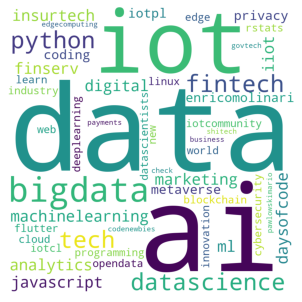

creating tf nmf weights
Topic 1: python, datascience, bigdata, iot, ai
Topic 2: enricomolinari, insurtech, finserv, marketing, fintech
Topic 3: learn, tech, privacy, digital, data
Topic 4: people, energy, technology, new, world
Topic 5: enilev, hanaelsayyed, curieuxexplorer, pawlowskimario, shitech
Topic 6: evankirstel, ev, fisherm, yuhelenyu, sustainability
Topic 7: ev, esg, fintech, space, remotework
Topic 8: ev, finserv, yuhelenyu, cryptocurrency, protocol
Topic 9: datavisualization, cybersecuritytips, pythonlearning, daysofcodechallenge, pythonprogramming
Topic 10: ev, fintech, yuhelenyu, jeromemonange, bitcoin
Topic 11: jblefevre, mashable, la, robot, robotics
Topic 12: fabriziobustama, yuhelenyu, drferdowsi, jeancayeux, thank


In [29]:
# dense_df.sample(frac=0.05)
'''
X_train = sample_df.copy()
y_train = sample_df['y3'].copy()
X_train = X_train.drop(columns=['y3','y10'])
'''

tf_df, tf, tf_words = create_tf_df(500, X['processed'], "twitter")

print("creating tf nmf weights")
nmf_tf_df = create_nmf_df(12, 5, tf, "lumin", tf_words)

In [30]:
topic_model = BERTopic(language="english", calculate_probabilities=True, verbose=True)
#JBtopics, JBprobs = topic_model.fit_transform(tf_words)
JBtopics, JBprobs = topic_model.fit_transform(X['processed'])

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

Batches:   0%|          | 0/790 [00:00<?, ?it/s]

2022-11-08 19:03:14,997 - BERTopic - Transformed documents to Embeddings
2022-11-08 19:04:21,011 - BERTopic - Reduced dimensionality
2022-11-08 19:09:09,424 - BERTopic - Clustered reduced embeddings


In [31]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name
0,-1,8602,-1_the_to_of_is
1,0,606,0_betamoroney_pawlowskimario_curieuxexplorer_k...
2,1,523,1_iotchannel_iotcommunity_iotpractitioner_iotpl
3,2,435,2_bot_flutter_govtech_tensorflow
4,3,322,3_ukraine_war_russia_russian
5,4,312,4_well_yikes_co_https
6,5,234,5_reddit_developer_jobs_datasecurity
7,6,208,6_energy_solar_renewables_electricity
8,7,194,7_protocol_beyondprotocol_beyond_crypto
9,8,186,8_tmobile_5g_verizon_5gamericas


-1 refers to all outliers and should typically be ignored. Next, let's take a look at a frequent topic that were generated:

In [45]:
topic_model.get_topic(6)  # Select the most frequent topic

[('energy', 0.02091131013043816),
 ('solar', 0.016243941533234312),
 ('renewables', 0.0146658690437767),
 ('electricity', 0.01132251871200319),
 ('wind', 0.01005912073428046),
 ('renewable', 0.009700946331565947),
 ('environment', 0.009524142906464103),
 ('fossil', 0.009401011062302768),
 ('economic', 0.009347840825408961),
 ('sustainability', 0.008020784842725823)]

In [46]:
topic_model.get_representative_docs(6)

['nuclear is cleaner than solar  cleaner means cleaner footprint too  https   t co jlonfq9mj7',
 'this incredible computer is powered by algae    innovation  renewables  iot  sustainability  sdgs    hana_elsayyed  shi4tech  nevillegaunt  betamoroney  curieuxexplorer  anand_narang  pawlowskimario  jeroenbartelse  akwyz  ragusosergio  kalydeoo  mvollmer1  fabriziobustama  efipm https   t co y3vutms29z',
 'since 1992 i ve been sending out a monthly exploration of current events including essays on geopolitics energy depletion and suggestions for weathering the coming energy and economic transition   you can subscribe to my monthly museletter here  https   t co ncg7mvj5le https   t co fk8uccfuxp']

In [33]:
topic_model.get_topic(43)  # Select the most frequent topic

[('finance', 0.060443715102455955),
 ('reporting', 0.03844973266139689),
 ('stockmarket', 0.027561859343022806),
 ('trading', 0.024731660018604596),
 ('financial', 0.024145365736612794),
 ('stocktrading', 0.020349079150543375),
 ('banking', 0.01940407504537297),
 ('fintech', 0.01904923786354714),
 ('investment', 0.01787966775367801),
 ('bitcoin', 0.017656533398637403)]

In [34]:
topic_model.get_topic(51)  # Select the most frequent topic

[('vr', 0.05767252779464781),
 ('ar', 0.03173131644476373),
 ('virtual', 0.022861871813993847),
 ('virtualreality', 0.020618803292257754),
 ('infancy', 0.01868980859737462),
 ('retailtech', 0.018638572726610573),
 ('lets', 0.01588968798394178),
 ('meta', 0.015188243547204152),
 ('metaverse', 0.013135761207362194),
 ('headset', 0.011307105210909442)]

In [35]:
topic_model.visualize_topics()

In [47]:
topic_model.generate_topic_labels(nr_words=3, topic_prefix=True, word_length=None, separator='_')

['-1_the_to_of',
 '0_betamoroney_pawlowskimario_curieuxexplorer',
 '1_iotcommunity_iotchannel_iotchannel iotcommunity',
 '2_python flutter_flutter_bot',
 '3_ukraine_war_russia',
 '4_co_https co_https',
 '5_ai datasecurity_rstats reactjs_iiot flutter',
 '6_energy_solar_renewables',
 '7_beyond protocol_protocol_crypto',
 '8_tmobile_5g_verizon',
 '9_ai for_responsible ai_makers https',
 '10_biometricupdate_biometric_biometrics',
 '11_javascript rstats_coding javascript_codenewbies tech',
 '12_privacy_privacy learn_data privacy',
 '13_china_india_chinese',
 '14_climatechange_environment_environment https',
 '15_nfts_nft_an nft',
 '16_autoindustry_ev_automobileindustry',
 '17_reporting_iot reporting_analytics reporting',
 '18_chatbots_nlp_chatbots bigdata',
 '19_remotework_remotework https_from home',
 '20_twitter_socialmedia https_socialmedia',
 '21_energy_energy sector_sector',
 '22_privacy_privacy check_check it',
 '23_edgecomputing_edge_the edge',
 '24_oil_http co_http',
 '25_the metave

In [36]:
topic_model.visualize_distribution(JBprobs[200], min_probability=0.0002)

In [37]:
topic_model.visualize_hierarchy(top_n_topics=30)

In [38]:
topic_model.visualize_barchart(top_n_topics=20)

In [39]:
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

In [40]:
topic_model.visualize_term_rank()

In [41]:
topic_model2 = topic_model.update_topics(X['processed'], JBtopics, n_gram_range=(1, 2))

In [42]:
topic_model.get_topic(20)   # We select topic that we viewed before

[('twitter', 0.04588169169487183),
 ('socialmedia https', 0.024078503939521472),
 ('socialmedia', 0.024042829440995943),
 ('elonmusk', 0.022772687857035536),
 ('elon', 0.016350738542795076),
 ('musk', 0.0150915670023895),
 ('cnbc socialmedia', 0.011934125901977231),
 ('verge socialmedia', 0.011034295654575624),
 ('elon musk', 0.010575939043950634),
 ('verge', 0.009633856387089459)]

In [48]:
similar_topics, similarity = topic_model.find_topics("tech", top_n=5); similar_topics

[191, 343, 222, 135, 302]

In [56]:
print(topic_model.get_topic(191))
print(topic_model.get_topic(343))
print(topic_model.get_topic(222))
print(topic_model.get_topic(135))
print(topic_model.get_topic(302))

[('education', 0.05305746919316038), ('edtech', 0.04539403479594603), ('education edtech', 0.04015044584545669), ('edtech https', 0.029965088776422975), ('edtech technology', 0.01675439725919542), ('school', 0.01632934593091714), ('in higher', 0.015067684910403348), ('higher education', 0.014692851547124849), ('higher', 0.014580904979726956), ('technology', 0.01249692277187421)]
[('stem', 0.03805243777923627), ('futureofwork marketing', 0.028023576693883), ('insurtech stem', 0.02775863125985136), ('the bigtech', 0.02659845228058464), ('bigtech and', 0.02659845228058464), ('finserv insurtech', 0.026556769637567503), ('and futureofwork', 0.02496409168870326), ('startup', 0.02238828706558217), ('entrepreneur', 0.0218519087462903), ('bigtech', 0.020122234004205933)]
[('agriculture', 0.06118085116747591), ('agtech', 0.056425912286336935), ('digital agriculture', 0.05285624558202282), ('automation and', 0.051812691492538775), ('paletteskills', 0.04915959690617719), ('agtech https', 0.0485985

In [49]:
# Save model
topic_model.save("ds_model_Nov8")

/usr/local/lib/python3.7/dist-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.



In [50]:
# Load model
my_model = BERTopic.load("ds_model_Nov8")	

In [57]:
topic_model.visualize_barchart(top_n_topics=40)

In [58]:
topic_model.visualize_hierarchy(top_n_topics=40)

In [59]:
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

In [60]:
topic_model.visualize_topics()

In [ ]:
topic_model.get_topic(276) 

In [ ]:
freq = topic_model.get_topic_info(); freq.head(12)

In [ ]:
freq = topic_model.get_topic_info(0); freq.head()

In [ ]:
topic_model.visualize_distribution(JBprobs[200], min_probability=0.00005)

In [ ]:
topic_model.get_topic(232)   # We select topic that we viewed before

In [ ]:
topic_model.get_topic(208)   # We select topic that we viewed before